# Introduction to Bayesian Inference and Markov Chain Monte Carlo
#### Nikolay Oskolkov, SciLifeLab, NBIS Long Term Support, [nikolay.oskolkov@scilifelab.se](nikolay.oskolkov@scilifelab.se)

<h3><center>Abstract</center></h3>
Here we will gently introduce basic priciples of Bayesian Inference and Markov Chain Monte Carlo (MCMC) and apply them to the Phenotypic Data from the project of Marju Orho-Melander from Lund University. We discuss when Bayesian Statistics should be used and briefly compare it with Frequentist Statistics and Deep Learning. Next, we introduce the concepts of Prior, Likelihood and Posterior probabilities and derive an analytical solution of the Bayes rule under the assumption of so-called conjugate Prior. Further, we compare Maximum Likelihood Estimate (MLE) approach with Bayesian Inference. Finally, we introduce concepts of Markov Chain and Monte Carlo simulation and show how to implement Markov Chain Monte Carlo (MCMC) in Stan and PyMC3 to solve a real-world problem of prediction of Body Mass Index (BMI) at a certain Age.  

### Table of Contents:
* [What Is Bayesian Statistics For You?](#What Is Bayesian Statistics For You?)
* [When Should You Use Bayesian Statistics?](#When Should You Use Bayesian Statistics?)
* [When Frequentist Statistics Not Enough](#When Frequentist Statistics Not Enough)
* [Why Frequentist Statistics is Brain Damaging](#Why Frequentist Statistics is Brain Damaging)
* [Maximum Likelihood Estimate](#Maximum Likelihood Estimate)
* [Prior](#Prior)
* [Posterior](#Posterior)
* [Introduction to Stan](#Introduction to Stan)
* [Introduction to Markov Chain Monte Carlo](#Introduction to Markov Chain Monte Carlo)

### What Is Bayesian Statistics For You? <a class="anchor" id="What Is Bayesian Statistics For You?"></a>

For many of us Bayesian Statistics is a dark voodoo magic at best or a completely subjective nonsense at worst. Here we will try to show how simple and elegant Bayesian Statistics can be and motivate why you should use it.

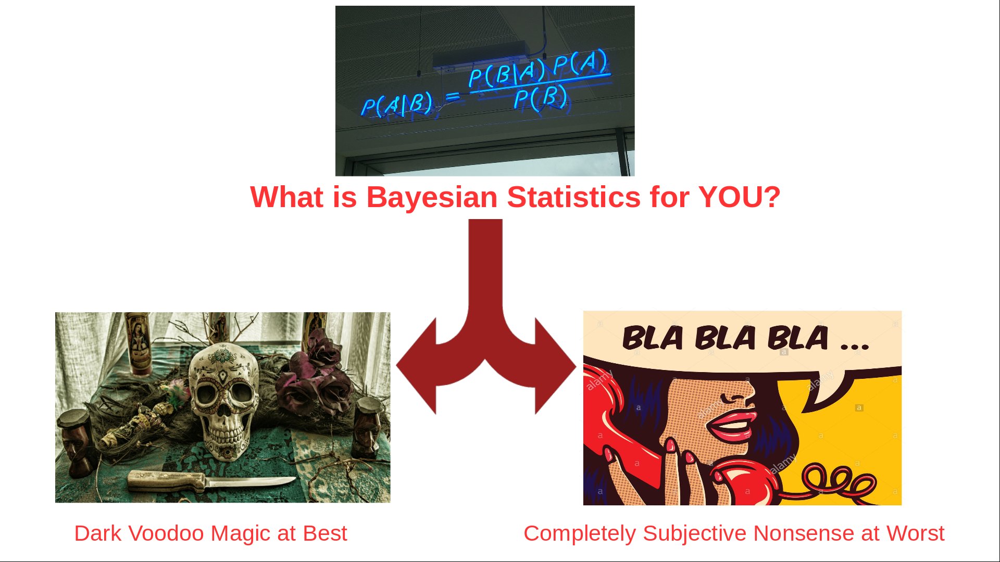

In [1]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/BayesianStatistics.png')

Bayesian Statistics can be very useful when you would like to skip thinking about:
* **Handling Missing Data**
* **Handling Non-Gaussian Data**
* **Cause or Consequence**
* **Lack of Statistical Power**
* **Overfitting and Correction for Multiple Testing (FDR)**
* **Testing for Significance and P-Value**

### When Should You Use Bayesian Statistics? <a class="anchor" id="When Should You Use Bayesian Statistics?"></a>

To answer this question you need to check how much Data you have.

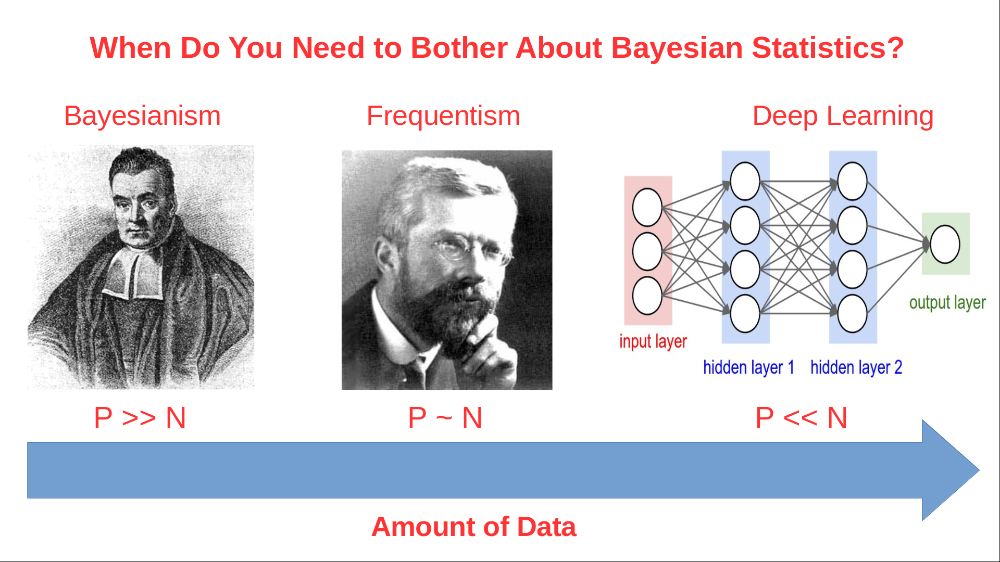

In [2]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/AmountOfData.png')

If we have **N samples** and **P features** in our data, we should definitely use Bayesian Statistics when **P >> N**, i.e. when number of features is much greater than number of samples. This is a typical setup for many biological projects and Frequentist analysis can not handle this situation ("underpowered study") without severe overfitting. As the data amount grows it makes more and more sense to use Frequentist and Deep Learning approaches.

Should you use Bayesian Statistics if you have Big Data? You might want to do it because the Big Data can be biased. Semi-successful tests of self-driving cars gave a rise to **Bayesian Deep Learning**.

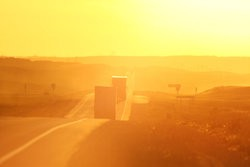

In [3]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/AleatoricUncertainty.jpg')

The main idea: to let the machine know how much it does not know through **Uncertainty**. The more a machine/person realizes how much it/he/she does not know the more *Intelegent* the machine/person is. Alex Kendall, one of the Deep Learning gurus, excellently describes [the need for Uncertainty in Deep Learning](https://alexgkendall.com/computer_vision/bayesian_deep_learning_for_safe_ai/) in his blog. He describes the difference between **Epistemic** and **Aleatoric** uncertainties and shows how to implement them in the Loss function for a Neural Network.

Briefly, Epistemic Uncertainty is due to limitations of the training data set, while Aleatoric Uncertainty is related to impossibility of a Neural Network to correctly quintify the information, like on the picture above the self-driving car could not detect a vehicle in front due to a special sun light at dusk. Another great post describes how to [practically implement Bayesian Deep Lerning in Python](https://towardsdatascience.com/building-a-bayesian-deep-learning-classifier-ece1845bc09)

### When Frequentist Statistics Not Enough <a class="anchor" id="When Frequentist Statistics Not Enough"></a>

Sometimes you really feel that there is something wrong with the Frequentist Statistics, i.e. you really start feel uncomfortable. Here there are a few examples:

In [4]:
%%latex
\begin{align}
\rm{Can \,we \,claim \,that:\qquad}
0.05 \approx \frac{12}{250} < \frac{2}{15} \approx 0.13
\end{align}

<IPython.core.display.Latex object>

* Imagine you have seen 12 copies of an effect allele in 250 healthy individuals, and you observe 2 copies of the effect allele in a cohort of 15 elite athletes. Can you really say that the effect allele is enriched in the elite athletes?

**Here you need a Bayesian Inference to overlap two credibility intervals**

David Robinson in [his blog shows](http://varianceexplained.org/r/empirical_bayes_baseball/) how incorporation of empirical Prior information helps to compare batting averages between two baseball players.

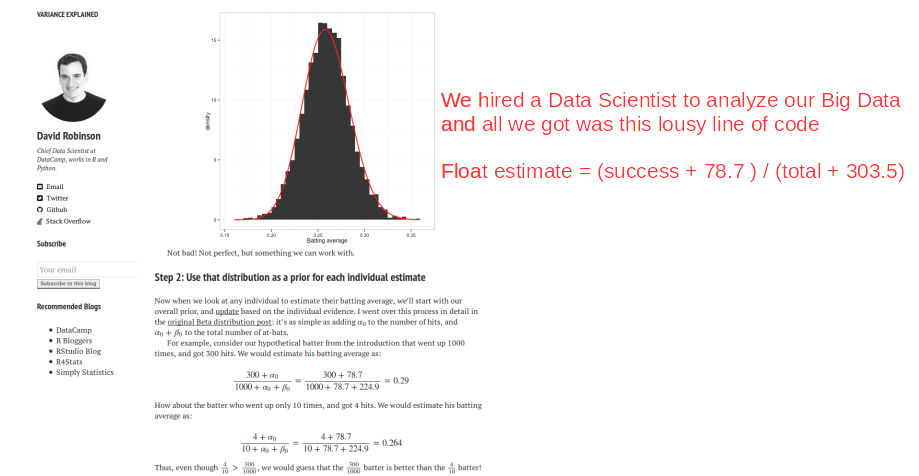

In [5]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/EmpiricalBayes.png')

* Your analysis identified a few factors (genetic or metilation marker, gene, protein) that might be related to a desease you study. However you have difficulty answering question "is this factor a cause or a consequence of the other factor?"   

** Here you need a Bayesian Inference which is based on conditional probabilities and hence adresses causality**

Think that Bayesian Statistics is based on conditional probabilities and P(A|B) is not necessarily eqial to P(B|A), this automatically gives you causal relation between A and B, like in case of Bayesian Network below that correctly figures out how Diabetes-related factors cause each other:

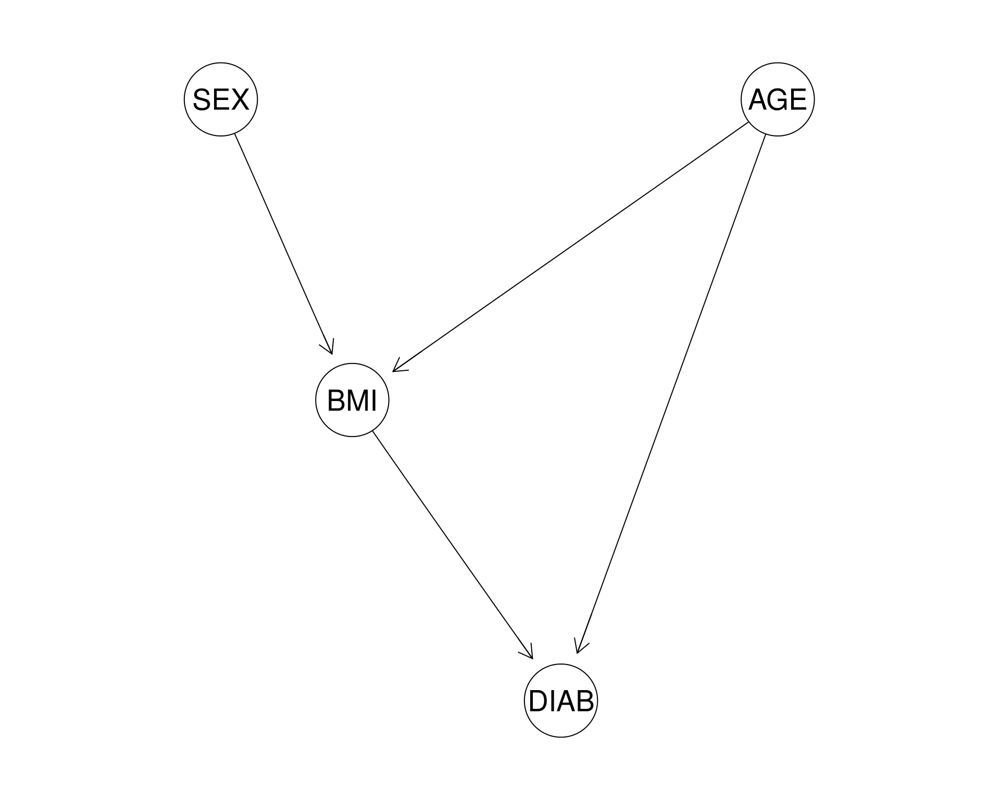

In [6]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/bn_diab.png')

* You know that diabetes prevalence in Sweden is 10%. You are checking Electronic Health Records for 100 random individuals. How many of them would you expect to have diabetes? Well, based on the prevalence, approximately 10. However you do not have lower and upper bounds and you really would like to know variation in the frequency which you do not get for free in Frequentist Statistics. 

** Here you need a Bayesian Inference which automatically gives you a credibility interval**

The only thing you can do in the frameworks of classical/Frequentist statistics to estimate the uncertainty is to bootstrap. However, [bootstrap is nothing more than just a sampling from Posterior distribution](http://www.sumsar.net/blog/2015/04/the-non-parametric-bootstrap-as-a-bayesian-model/) as Rasmus Bååth very elegantly explains.

* Imagine you just got a project with only 15 biological replicates and need to do differential gene expression analysis. From the point of view of Frequentist Statistics, the study is underpowered, implying that the results of the analysis are not generalizable, due to overfitting.


**Here you need a Bayesian Inference to have less false positive discoveries**

Andrew Gelman in his [fantastic blog post](http://andrewgelman.com/2016/08/22/bayesian-inference-completely-solves-the-multiple-comparisons-problem/) very elegantly explains how Bayesian Statistics provides a 0 probability to make a claim with confidence in case of noisy data while Frequentist Statistics still have 5% of False Positives.

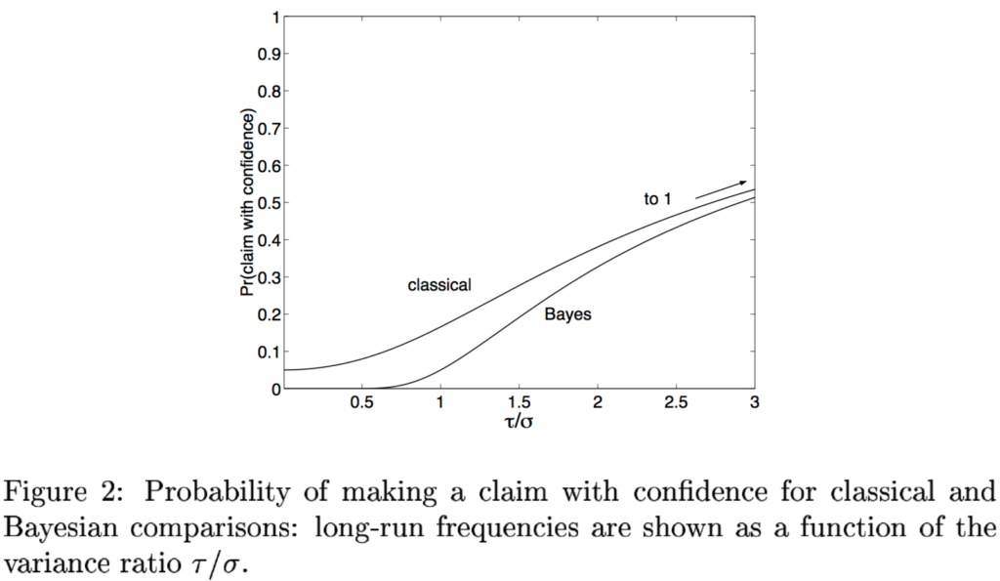

In [40]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/claims_with_confidence.png')

### Why Frequentist Statistics is Brain Damaging <a class="anchor" id="Why Frequentist Statistics is Brain Damaging"></a>

There are many reasons to be cautious when applying Frequentist Statistics. It is heavily based on normality assumtion and is sensitive to outliers. Thus operating with simple discriptive statistics which do not always reflect the underlying distribution Frequentist Statistics fails to correctly capture the difference in data at the Anscombe's quartet below when all the data sets have identical linear regression slopes but very different data distributions:

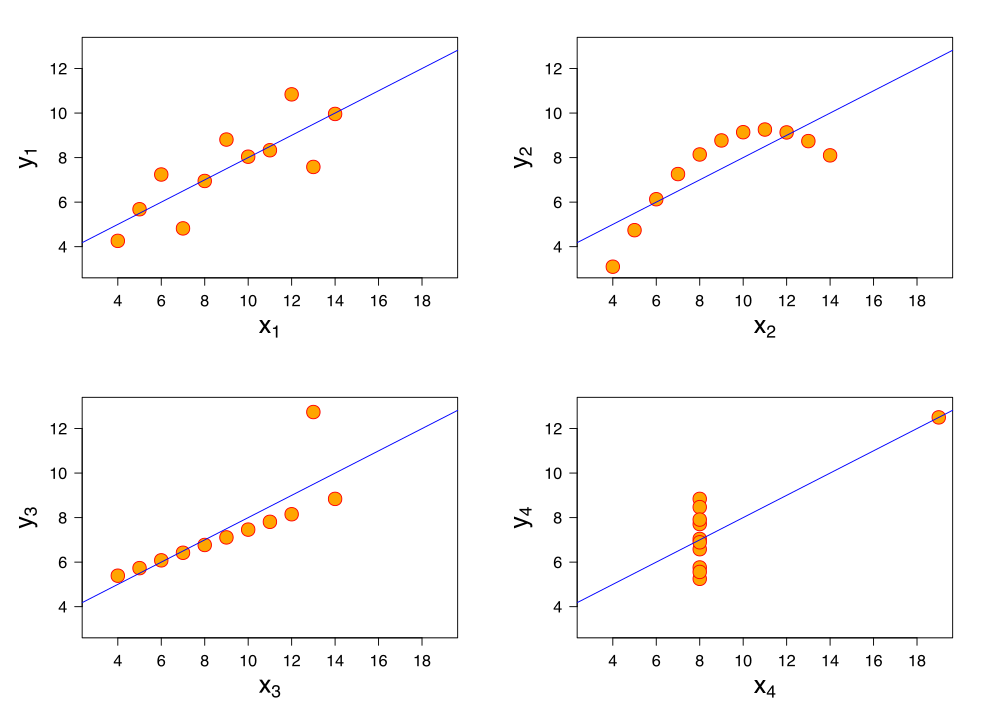

In [7]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/Anscombes_quartet.png')

In contrast, Bayesian Statistics operates with Posterior distributions (i.e. a Posterior distribution is a primary output of Bayesian Inference) which are more correct representations of the data. There are a few more famous examples called "DataSaurus" which demonstrate that Frequentist Statistics can not capture the difference between groups of samples with identical desriptive statistics such as mean, standard deviation or Pearson's correlation coefficient.  

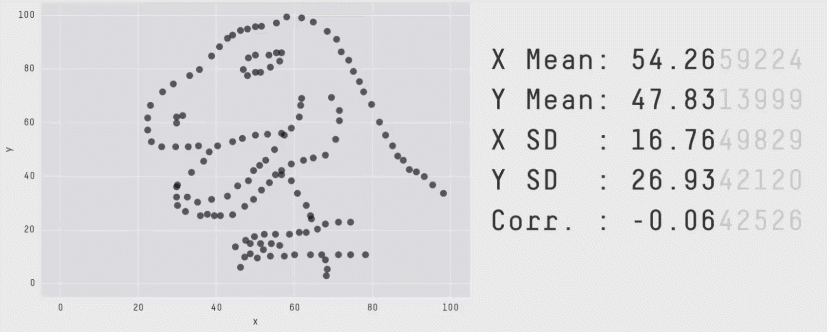

In [8]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/DataSaurus.gif.png')

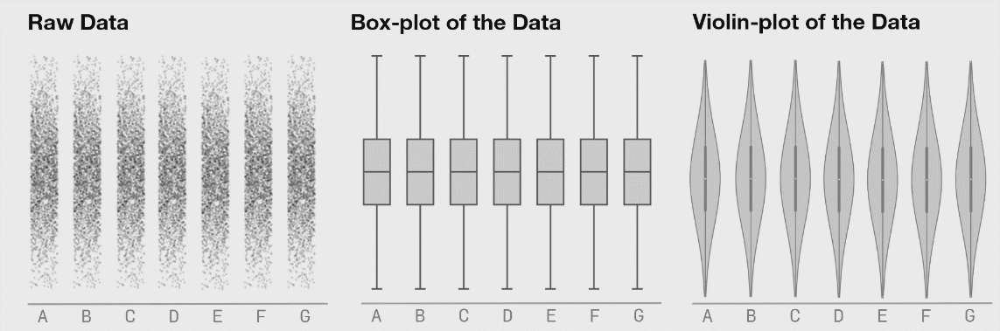

In [9]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/BoxViolinSmaller.gif.png')

For instance, association studies essentially compare means and standard deviations between groups of samples and therefore miss hidden differences.

So what is the main difference between Bayesian and Frequentist Statistics? Bayesian and Frequentist Statistics differ in their definition of probability.

* **For a Frequentist a probability is entirely related to the frequency of events, i.e. data are random but the parameters of the model are fixed.**
* **For a Bayesianist a probability reflects a degree of knowledge about an event, i.e. data are fixed but the parameters of the model are random.**

### Maximum Likelihood Estimate <a class="anchor" id="Maximum Likelihood Estimate"></a>

In this section we will address a question: "What would be the Body Mass Index (BMI) of a typical Swedish citizen based on the data we have?" using solely Frequentist Statistics. For this purpose we will use the BMI data from the Malmö Offspring Study (MOS) project of PI Marju Orho-Melander from Lund University.

In [10]:
import pandas as pd
phen = pd.read_csv('/home/nikolay/WABI/M_Orho_Mellander/FromLouise/Age_sex_BMI_WABI2017.csv')
phen.fillna(phen.mean(), inplace = True)
phen.head()

,lopnr,age_scr,sex,BMI
0,12104,25.051335,Male,22.95568
1,12105,22.680356,Male,23.19832
2,12106,20.492813,Male,57.47126
3,42106,25.229295,Female,23.24598
4,42108,22.811773,Female,19.95728


If we consider **N** BMI data points, in order to calculate the BMI of a typical citizen of Sweden we will need to maximize the *likelihood* to observe the **N** BMI data points simultaneously, this is so-called Maximum Likelihood Estimate (MLE) technique. We assume the *likelihood* to have the Gaussian shape with mean **$\mu$** and standard deviation **$\sigma$**. Therefore **$\mu$** is nothing else as the BMI of a typical Swedish citizen:

In [11]:
%%latex
\begin{align}
\rm{L}\,(\,\rm{BMI_i} \,|\, \mu,\sigma\,) =
\prod_{i=0}^{N}\frac{1}{\sqrt{2\pi\sigma²}} \exp^{\displaystyle -\frac{(BMI_i-\mu)^2}{2\sigma²}}
\end{align}

<IPython.core.display.Latex object>

Maximizing the probability will automatically result (please check) in a well known equations for mean and standard deviation: 

In [12]:
%%latex
\begin{align}
\mu = \frac{1}{N}\sum_{i=0}^N \rm{BMI_i}\\
\sigma^2 = \frac{1}{N}\sum_{i=0}^N (\rm{BMI_i}-\mu)^2
\end{align}

<IPython.core.display.Latex object>

Let us randomly select 3 data points, i.e. **N = 3** and visualize the *likelihood*:

We selected the following BMI data points: [22.151020000000003, 18.424039999999998, 30.0215]
Mean BMI value: 23.532186666666664
BMI Standard Deviation: 4.834320747442764


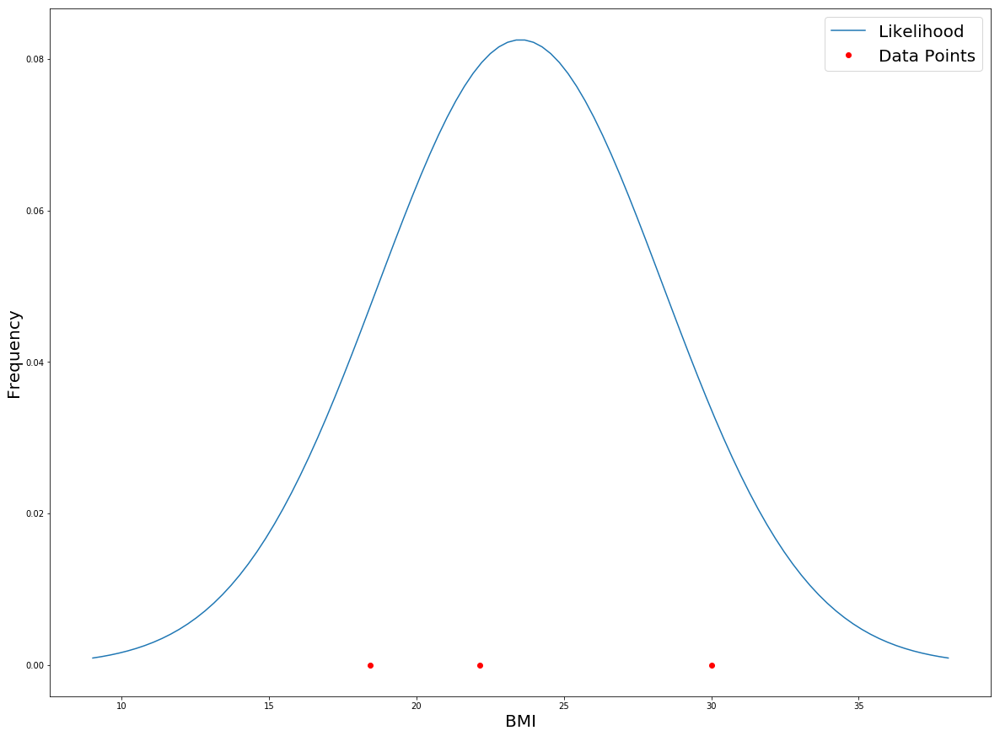

In [13]:
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab

bmi_random=random.sample(list(phen['BMI']),3)
print("We selected the following BMI data points: {}".format(bmi_random))

bmi_mean = np.array(bmi_random).mean()
if len(bmi_random) < 2:
    bmi_sigma = bmi_mean
else:
    bmi_sigma = np.array(bmi_random).std()
print("Mean BMI value: {}".format(bmi_mean))
print("BMI Standard Deviation: {}".format(bmi_sigma))

x = np.linspace(bmi_mean - 3*bmi_sigma, bmi_mean + 3*bmi_sigma, 100)
plt.figure(figsize=(20,15))
plt.plot(x, mlab.normpdf(x, bmi_mean, bmi_sigma))
plt.plot(bmi_random,list(0 for i in range(0,len(bmi_random))),'ro')

plt.ylabel('Frequency', fontsize = 20)
plt.xlabel('BMI', fontsize = 20)
plt.legend(['Likelihood','Data Points'], loc='upper right', fontsize = 20)
plt.show()

### Prior <a class="anchor" id="Prior"></a>

To start using Bayes rule we will have to have a prior probability. We select a Gaussian prior with mean=35 and standard deviation sd=4. We obviously have just moved to Sweden from the US and think that a typical BMI of people is 35. Another reason might be that we have heard a lot about obesity growing world-wide and exaggerate its prevalence. Let us display our prior: 

We selected the following BMI data points: [22.948119999999999, 32.368549999999999, 28.049670000000003]
Mean BMI value: 27.788780000000003
BMI Standard Deviation: 3.8502963557194745


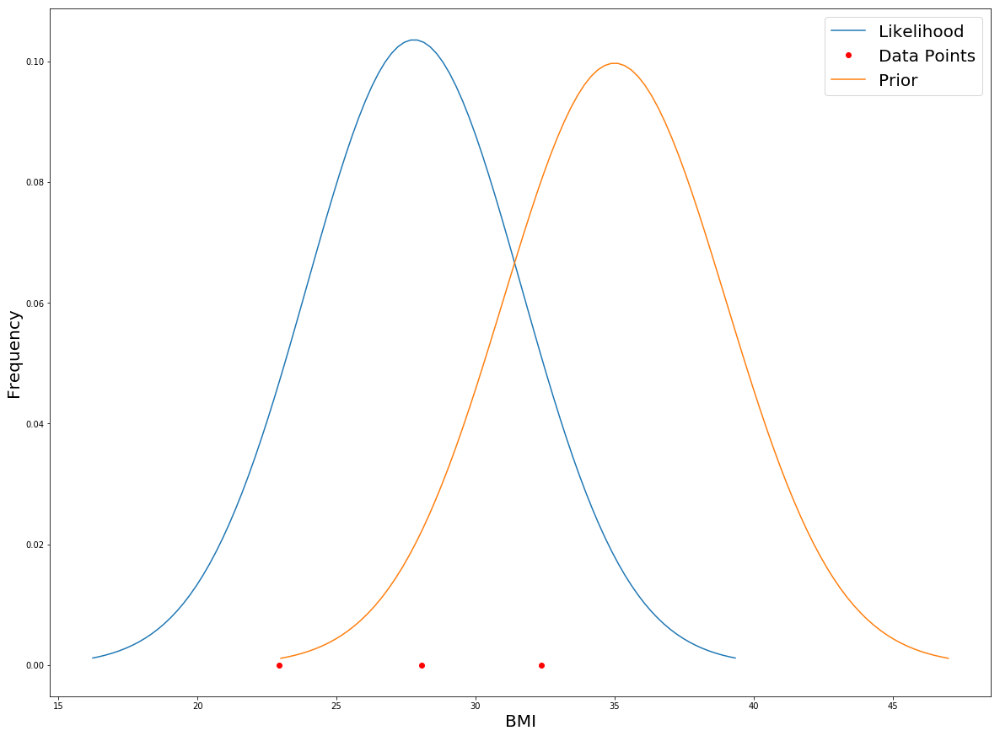

In [14]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (20,15)

import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab

bmi_random=random.sample(list(phen['BMI']),3)
print("We selected the following BMI data points: {}".format(bmi_random))

bmi_mean = np.array(bmi_random).mean()
if len(bmi_random) < 2:
    bmi_sigma = bmi_mean
else:
    bmi_sigma = np.array(bmi_random).std()
print("Mean BMI value: {}".format(bmi_mean))
print("BMI Standard Deviation: {}".format(bmi_sigma))

x = np.linspace(bmi_mean - 3*bmi_sigma, bmi_mean + 3*bmi_sigma, 100)
plt.plot(x, mlab.normpdf(x, bmi_mean, bmi_sigma))
plt.plot(bmi_random,list(0 for i in range(0,len(bmi_random))),'ro')

prior_mean = 35
prior_sigma = 4
x = np.linspace(prior_mean - 3*prior_sigma, prior_mean + 3*prior_sigma, 100)
plt.plot(x, mlab.normpdf(x, prior_mean, prior_sigma))

plt.ylabel('Frequency', fontsize = 20)
plt.xlabel('BMI', fontsize = 20)
plt.legend(['Likelihood','Data Points','Prior'], loc='upper right', fontsize = 20)
plt.show()

Prior is one of the corner stones of Bayesian Statistics. Its primary purpose is to incorporate *an expert knowledge* into a scientific problem. But the concept of Prior is much deeper than just that. Prior adds a **regularization** to the Maximum Likelihood Estimate (MLE) in case of small sample size or biased data. Imagine we want to know what would be a typical BMI in Sweden of a person of a certain Age and certain Sex. For this purpose we will model that BMI depends linearly on Age and Sex:

In [15]:
%%latex
\begin{align}
\rm{BMI_i} \sim N(\mu_i,\sigma) \\
\mu_i = \alpha + \beta_1 \rm{Age_i} + \beta_2 \rm{Sex_i} \\
\rm{L}\,(\,\rm{BMI_i} \,|\, \mu_i,\sigma\,) =
\prod_{i=0}^{N}\frac{1}{\sqrt{2\pi\sigma²}} \exp^{\displaystyle -\frac{(BMI_i-\mu_i)^2}{2\sigma²}}
\end{align}

<IPython.core.display.Latex object>

Now if you have just 3 data points like in the example above, you are likely not be able to fit MLE Linear Regression without severe overfitting since you have 4 fitting parameters: $\alpha$, $\beta_1$, $\beta_2$ and $\sigma$. For this purpose, in Frequentist Statistics one can use a Ridge regilarizaion, where you put a constraint on the coefficeints of explanatory variables like this:

In [16]:
%%latex
\begin{align}
\rm{BMI_i} \sim N(\mu_i,\sigma) \\
\mu_i = \alpha + \beta_1 \rm{Age_i} + \beta_2 \rm{Sex_i} \\
\rm{L}\,(\,\rm{BMI_i} \,|\, \mu_i,\sigma\,) =
\prod_{i=0}^{N}\frac{1}{\sqrt{2\pi\sigma²}} 
\exp^{\displaystyle -\frac{(BMI_i-\mu_i)^2}{2\sigma²} + \lambda(\beta_1^2 + \beta_2^2) }
\end{align}

<IPython.core.display.Latex object>

However including regularization is nothing more than including a Prior in order to correct the MLE model. So why the hell didn't we use a Prior from the beginning? One apparently needs to hit into overfitting problems with Frequentist Statistics in order to realize that using Prior assumptions is very helpful. 

### Posterior <a class="anchor" id="Posterior"></a>

Now it is time to calculate the Posterior distribution from the Likelihood and the Prior. Since we asumed both the Likelihood and the Prior to have Gaussian shape, it is easy to calculate the posterior analytically. This is the case of so-called **conjugate prior**, i.e. the Likelihood and the Prior have the same shape. Here we will randomly draw 20 BMI values and will add them one-by-one and monitor how the Posterior changes when we add more and more data: 

In [17]:
import warnings
warnings.filterwarnings('ignore')

import math
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (20,15)

from IPython import display
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import random

random.seed(12345678)

bmi_random_sample = random.sample(list(phen['BMI']),100)

for i in range(1,21):

    bmi_random = bmi_random_sample[0:i]
    
    bmi_mean = np.array(bmi_random).mean()
    if len(bmi_random) < 2:
        bmi_sigma = bmi_mean
    else:
        bmi_sigma = np.array(bmi_random).std()
    
    fig = plt.figure(1)

    axes = plt.gca()
    axes.set_xlim([10,50])
    axes.set_ylim([-0.001,0.16])

    #THIS IS THE LIKELIHOOD
    x = np.linspace(bmi_mean - 3*bmi_sigma, bmi_mean + 3*bmi_sigma, 100)
    plt.plot(x, mlab.normpdf(x, bmi_mean, bmi_sigma))
    plt.plot(bmi_random,list(0 for i in range(0,len(bmi_random))),'bo')
    plt.title(str(i) + ' Data Points', fontsize = 20)

    #THIS IS THE PRIOR
    prior_mean = 35
    prior_sigma = 4
    x = np.linspace(prior_mean - 3*prior_sigma, prior_mean + 3*prior_sigma, 100)
    plt.plot(x, mlab.normpdf(x, prior_mean, prior_sigma))

    #THESE ARE THE PARAMETERS OF THE POSTERIOR DISTRIBUTION AN THE POSTERIOR PLOT
    posterior_sigma = math.sqrt((math.pow(prior_sigma,2)*math.pow(bmi_sigma,2))/(math.pow(prior_sigma,2) 
                                                                             + math.pow(bmi_sigma,2)))
    posterior_mean = (bmi_mean*math.pow(prior_sigma,2) + prior_mean*math.pow(bmi_sigma,2)) / (math.pow(prior_sigma,2) 
                                                                      + math.pow(bmi_sigma,2))
    x = np.linspace(posterior_mean - 3*posterior_sigma, posterior_mean + 3*posterior_sigma, 100)
    plt.plot(x, mlab.normpdf(x, posterior_mean, posterior_sigma))

    plt.ylabel('Frequency', fontsize = 20)
    plt.xlabel('BMI', fontsize = 20)
    plt.legend(['Likelihood', 'Data Points', 'Prior', 'Posterior'], loc='upper right', fontsize = 20)
    
    fig.savefig('/home/nikolay/WABI/Misc/figs/DataPoints_' + str(i) + '.png')
    plt.gcf().clear()

So we have generated 20 png-plots for 20 Posteriors. Now we will merge them to a gif-file and rename to png in order to be able to insert into Jupyter.

In [18]:
%%bash
FILE=/home/nikolay/WABI/Misc/figs/movie.gif.png
if [ -f $FILE ]; then
    rm $FILE
fi
convert -delay 200 -loop 0 $(ls -v /home/nikolay/WABI/Misc/figs/*.png) /home/nikolay/WABI/Misc/figs/movie.gif
mv /home/nikolay/WABI/Misc/figs/movie.gif /home/nikolay/WABI/Misc/figs/movie.gif.png

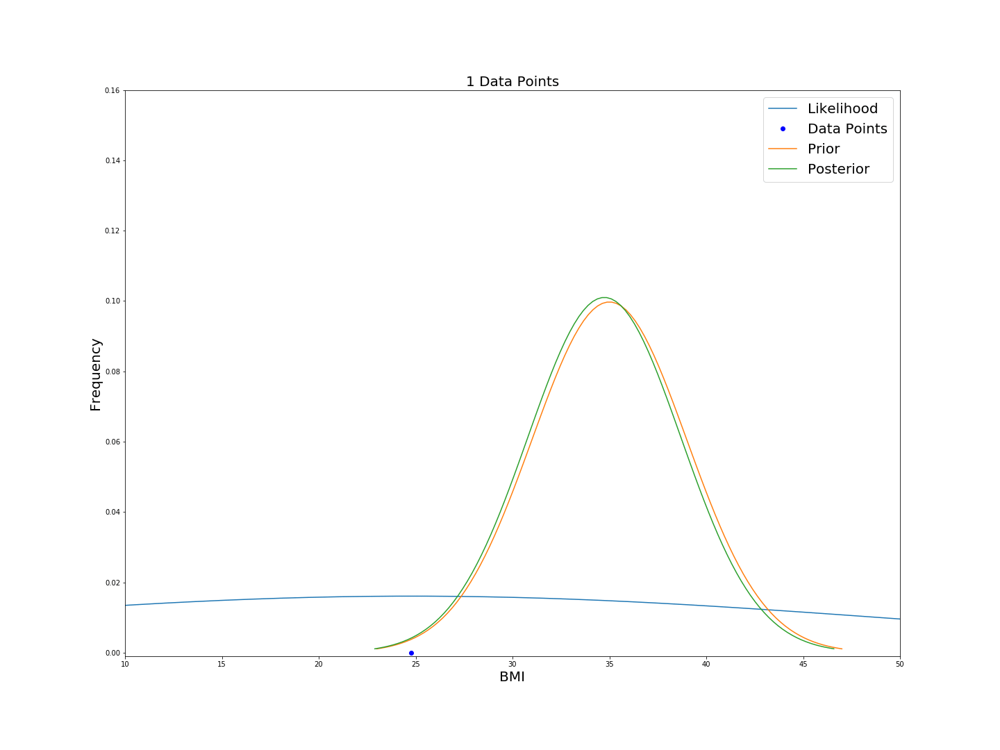

In [19]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/figs/movie.gif.png')

Here we observe that with only a few data points, the Posterior looks very much like the Prior. Adding more and more data shifts the posterior towards the Likelihood, i.e. the Prior becomes less and less dominant, it still has its regularizing function though.

### Introduction to Stan <a class="anchor" id="Introduction to Stan"></a>

Usually of course you do not have conjugate priors and you do not calculate the Posterior analitically. Often it is impossible to do analitically. A standard way to calculate a Posterior in Bayesian Inference is to use Stan, a special language for **Probabilistic Programming**. Stan has its own syntax, where you **define** your model rather than do a traditional programming. Stan usually has 3 blocks: model, data and parameters, out of them only *model* is compulsary.

In [20]:
with open('/home/nikolay/WABI/Misc/bmi.stan') as file:
    print(file.read())

data {
  int<lower=1> N; // number of observations
  real bmi[N];     // bmi needs to be set as real for the normal likelihood later
}

parameters {
  real bmi_exp;
  real<lower=0> sigma;
}

model {
  bmi_exp ~ normal(28, 5);
  sigma   ~ cauchy(0, 5);
  
  bmi     ~ normal(bmi_exp, sigma);
}



After you have defined your model and saved it as a \*.stan file, you can call the Stan model from R ("rstan") or Python ("pystan"). Remember to feed in the data into the model before calling it.

In [21]:
import rpy2
%load_ext rpy2.ipython

In [22]:
%%R
sink("temp.txt")
library("rstan")
library("animation")

my_bmi<-na.omit(read.csv("/home/nikolay/WABI/M_Orho_Mellander/FromLouise/Age_sex_BMI_WABI2017.csv"))$BMI
random_sample<-my_bmi[sample(length(my_bmi),25)]

saveGIF({
for(N_data_points in 5:25)
{
my_bmi<-random_sample[1:N_data_points]

stan.data <- list(N = length(my_bmi),
                  bmi = my_bmi)
stan_output <-stan(file = "/home/nikolay/WABI/Misc/bmi.stan",
                   data= stan.data,
                   iter = 1000, 
                   warmup = 500,
                   chains = 2, verbose = FALSE) 
#PRIOR
mean=35; sd=4
x <- seq(-4,4,length=100)*sd + mean
hx <- dnorm(x,mean,sd)
plot(x, hx, type="l", col="red",ylim=c(0,0.3),xlim=c(15,50),ylab="Frequency",xlab="BMI")
mtext(paste0(N_data_points," data points"))

#LIKELIHOOD
lines(density(my_bmi),col="blue")
# get points at axes
points(my_bmi,rep(0,length(my_bmi)), col="blue", pch=16)

#POSTERIOR
p <- extract(stan_output, "bmi_exp")$bmi_exp
lines(density(p))

legend("topright",legend=c("Prior","Likelihood","Posterior"),col=c("red", "blue","black"),lty=c(1,1,1),inset=0.02)
}
})
print(stan_output)
summary(stan_output)
file.rename("/home/nikolay/WABI/Misc/Bayesian_Inference/animation.gif",
            "/home/nikolay/WABI/Misc/Bayesian_Inference/animation.gif.png")

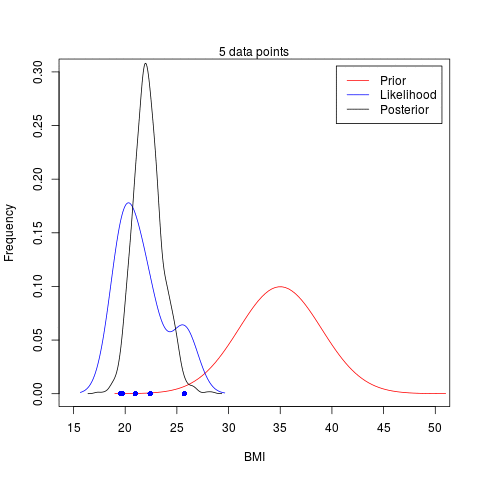

In [23]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/animation.gif.png')

Thus we get a simiar plots for Prior, Likelihood and Posterior. The only difference now is that the Posterior was calculated in Stan rather than analytically. The way Stan calculates the Posterior is called Markov Chain Monte Carlo (MCMC) algorithm.

### Introduction to Markov Chain Monte Carlo <a class="anchor" id="Introduction to Markov Chain Monte Carlo"></a>

Markov Chain is a memoryless random process, i.e. where the next step depends only on the previous step. Monte Carlo is a way to approximate some parameter by random sampling.

**Markov Chain Monte Carlo (MCMC) is a method to approximate the posterior distribution of a parameter of interest by finding a region in the parameter space (Markov Chain) of highest posterior distribution and random sampling (Monte Carlo) in this region**

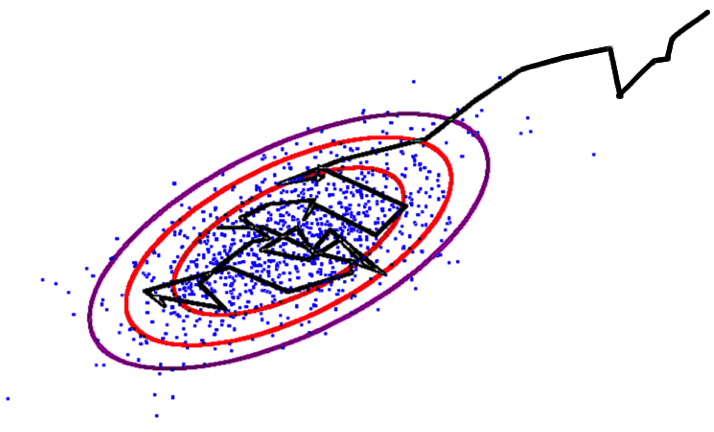

In [24]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/mcmc.png')

What is Monte Carlo simulation? This can be illustrated by approximating the area of a complex geometry by random throwing points and counting the fraction of points withon the geometry.

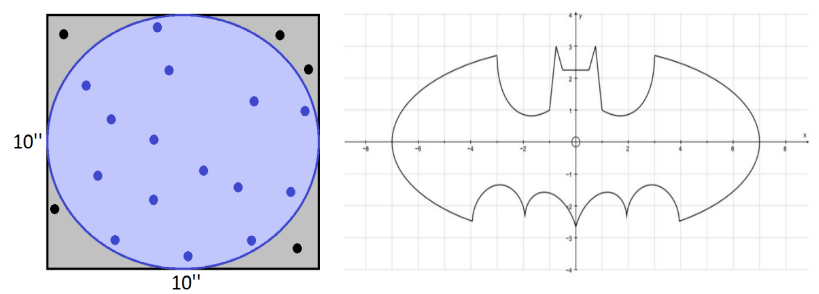

In [25]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/MC.png')

What is Markov Chain? It is a way to model a sequence of events where the next event depends only on the previous one, the next position of a segment of a polymer chain is determined by the position of the previous segment.

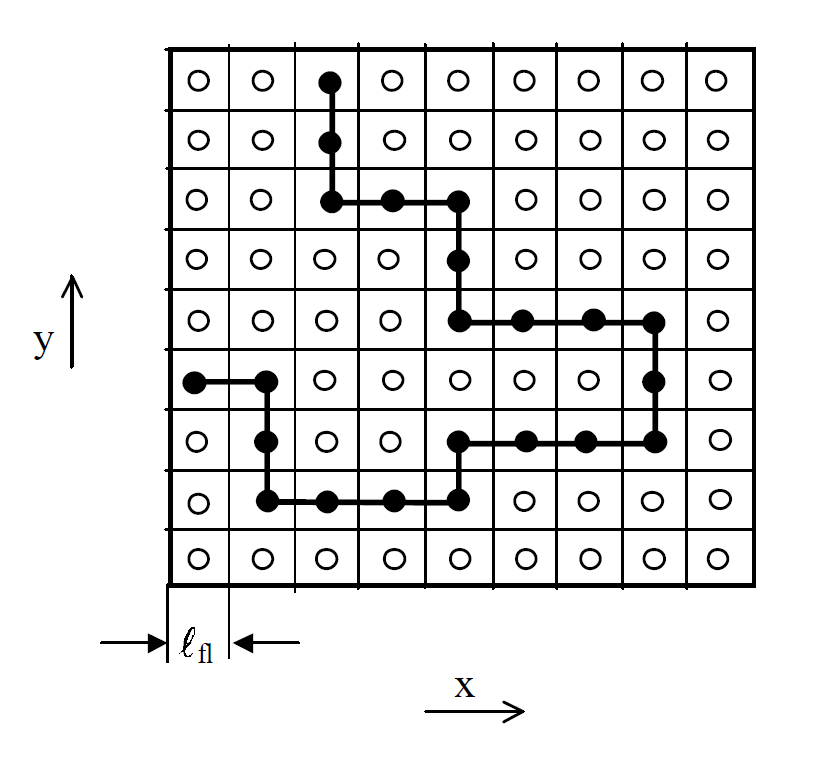

In [26]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/Bayesian_Inference/FloryLattice.png')

Let us demonstrate how MCMC works in Python by using PyMC3. Here we will make the example with finding a typical BMI a bit more complex. In the previous section we found what a typical BMI of a Swedish citizen would be, and found it to be around 27 based on just a few observations. However, we have heard that older people should have more problems with their weight compared to youner people. I have just checked my weight and found it to be 83.7 kg while I am 1.83 m tall, therefore my BMI is exactly equal to 25, so my BMI seems to below a mean BMI in Sweden, so I can be happy. But wait, maybe this is a lot for a 37 years old person like me? So probably I should have asked not just "what is a typical BMI in Sweden?" but "what would be a typical BMI in Sweden for people of my age, i.e. 37 years old?". So let us plot BMI vs. Age curve from the data from MOS project of Marju Orho-Melander from Lund University and first fir the Maximum Likelihood Linear Regression curve and then consider Bayesian Liear Regression. Again we will not use all the data but just select 26 random BMI and Age points:

In [27]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
phen = pd.read_csv('/home/nikolay/WABI/M_Orho_Mellander/FromLouise/Age_sex_BMI_WABI2017.csv')
phen.fillna(phen.mean(), inplace = True)
phen = phen.sample(frac = 0.01)
N = phen.shape[0]
print("""We selected {0} random points for analysis""".format(N))

We selected 26 random points for analysis


Let us plot BMI vs Age and fit a classical MLE Linear Regression:

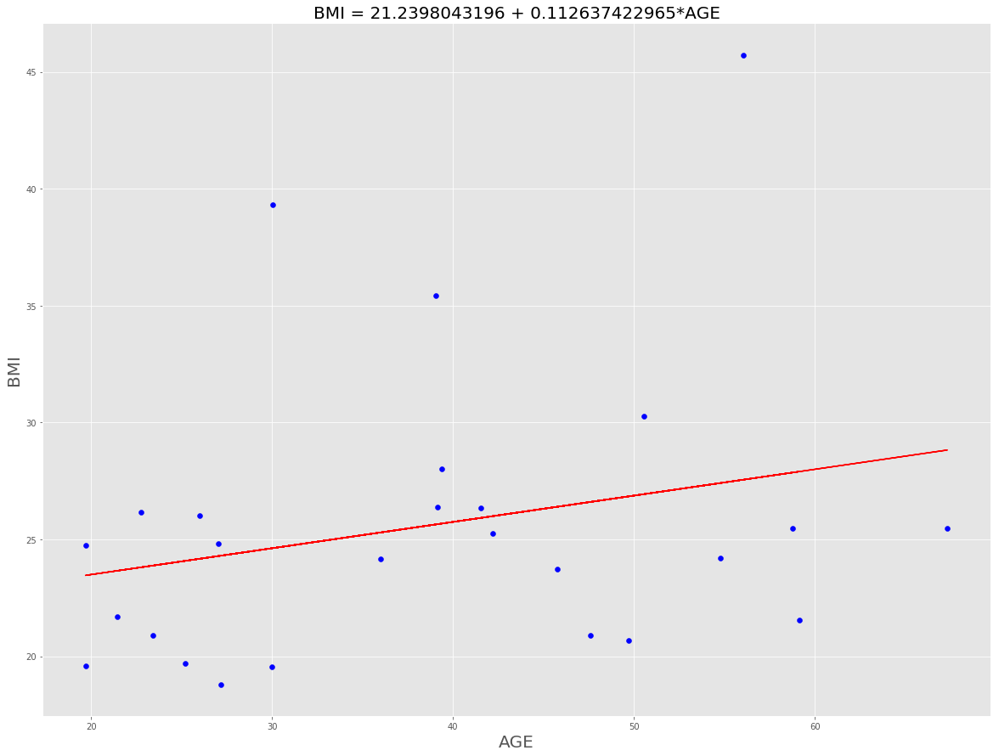

In [28]:
plt.figure(figsize=(20,15))
plt.style.use('ggplot')

import matplotlib.pyplot as plt
plt.scatter(phen['age_scr'],phen['BMI'], color = 'b')
plt.xlabel('AGE',fontsize = 20)
plt.ylabel('BMI',fontsize = 20)

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(phen['age_scr'].reshape(-1,1), phen['BMI'])
plt.plot(phen['age_scr'], lr.intercept_ + lr.coef_[0]*phen['age_scr'], color = 'r')
plt.title('BMI = ' + str(lr.intercept_) + ' + ' + str(lr.coef_[0]) + '*AGE', fontsize=20)
plt.show()

We can get the slope and the intercept from the Maximum Likelihood Estimate (MLE):

In [29]:
%%latex
\begin{align}
P(\alpha,\beta,\sigma) =
\prod_{i=0}^{N}\frac{1}{\sqrt{2\pi\sigma²}} \exp^{\displaystyle -\frac{(BMI_i-\alpha-\beta Age_i)^2}{2\sigma²}}
\end{align}

<IPython.core.display.Latex object>

In [30]:
def neg_normal_curve(parameters):
    alpha = parameters[0]
    beta = parameters[1]
    sigma = parameters[2]
    y = phen['BMI']
    x = phen['age_scr']
    return -np.prod((1/np.sqrt(2*np.pi*(sigma**2)))*np.exp(-(y-alpha-beta*x)**2/(2*(sigma**2))))

In [31]:
import numpy as np
from scipy import optimize
parameters_guess = [19, 0.15, 5]
parameters_est = optimize.fmin(neg_normal_curve, parameters_guess)
print("""
Maximum Likelihood Estimate: 
alpha = {parameters_est[0]:.5f}, beta = {parameters_est[1]:.5f}, sigma = {parameters_est[2]:.5f}
""".format(parameters_est = parameters_est))

Optimization terminated successfully.
         Current function value: -0.000000
         Iterations: 67
         Function evaluations: 125

Maximum Likelihood Estimate: 
alpha = 21.23982, beta = 0.11264, sigma = 5.95322



Now how would you do it with Bayesian Inference? For this purpose we will use PyMC3 Python module:

In [32]:
import pymc3 as pm
basic_model = pm.Model()

with basic_model:

    # Priors for unknown model parameters
    alpha = pm.Normal('alpha', mu=0, sd=10)
    beta = pm.Normal('beta', mu=0, sd=10)
    sigma = pm.HalfNormal('sigma', sd=1)

    # Expected value of outcome
    mu = alpha + beta*phen['age_scr']

    # Likelihood (sampling distribution) of observations
    Y_obs = pm.Normal('Y_obs', mu = mu, sd = sigma, observed = phen['BMI'])
    
    
    start = pm.find_MAP(model=basic_model)
    step = pm.Metropolis()

    # draw 20000 posterior samples
    trace = pm.sample(20000, step=step, start=start)

logp = -104.65, ||grad|| = 4.0542e-06: 100%|██████████| 32/32 [00:00<00:00, 4167.61it/s]
Multiprocess sampling (2 chains in 2 jobs)
CompoundStep
>Metropolis: [sigma_log__]
>Metropolis: [beta]
>Metropolis: [alpha]
100%|██████████| 20500/20500 [00:06<00:00, 2947.58it/s]
The number of effective samples is smaller than 10% for some parameters.


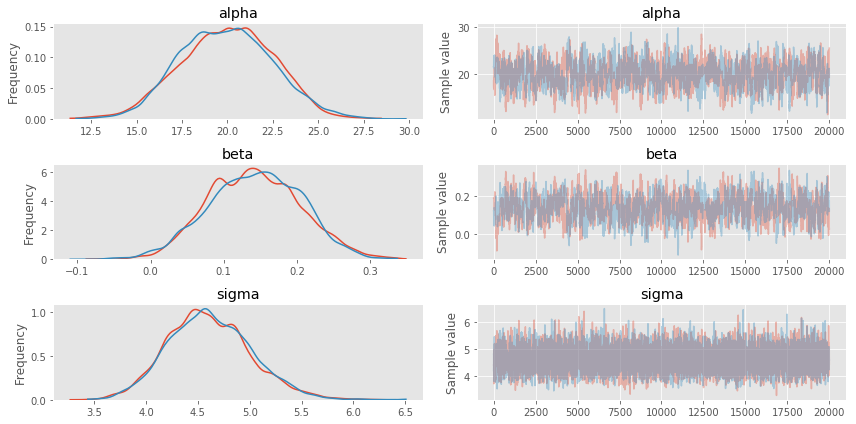

In [33]:
_ = pm.traceplot(trace)
plt.show()

In [34]:
alpha_b = np.mean(trace['alpha'][:-1000])
beta_b = np.mean(trace['beta'][:-1000])
sigma_b = np.mean(trace['sigma'][:-1000])
print("""
Bayesian Estimate: 
alpha = {parameters_est[0]:.5f}, beta = {parameters_est[1]:.5f}, sigma = {parameters_est[2]:.5f}
""".format(parameters_est = [alpha_b, beta_b, sigma_b]))


Bayesian Estimate: 
alpha = 19.98380, beta = 0.14135, sigma = 4.61074



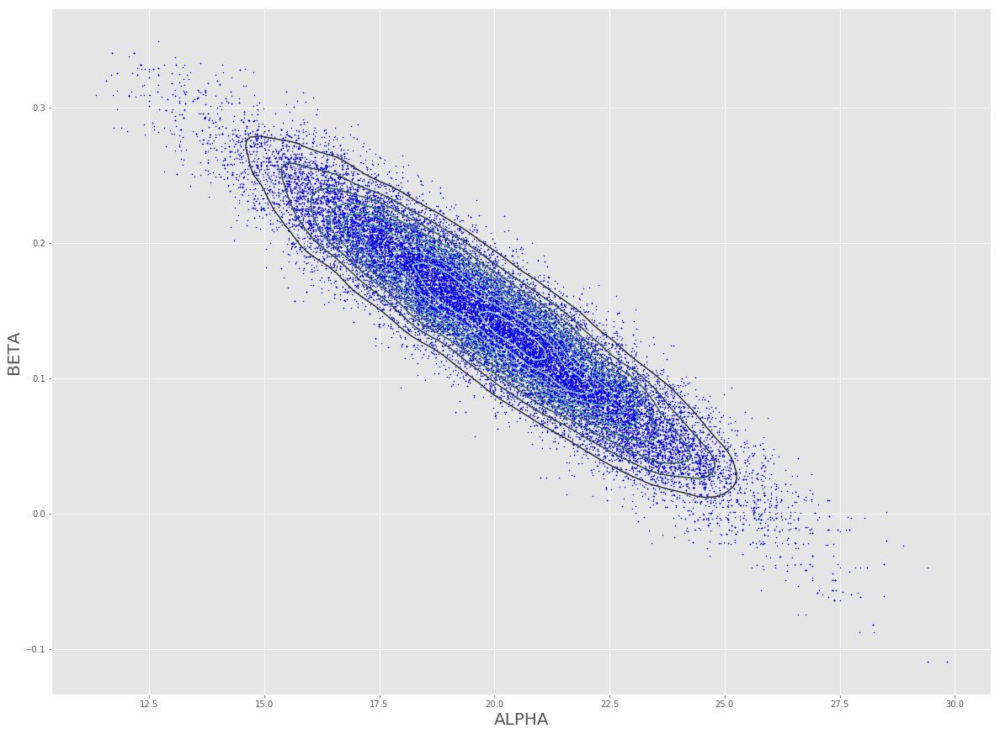

In [35]:
plt.figure(figsize=(20,15))
import seaborn as sns
sns.kdeplot(trace['alpha'],trace['beta'])
plt.xlabel('ALPHA', fontsize = 20)
plt.ylabel('BETA', fontsize = 20)
plt.style.use('ggplot')
plt.scatter(trace['alpha'],trace['beta'], color = 'b', s = 1)
plt.show()

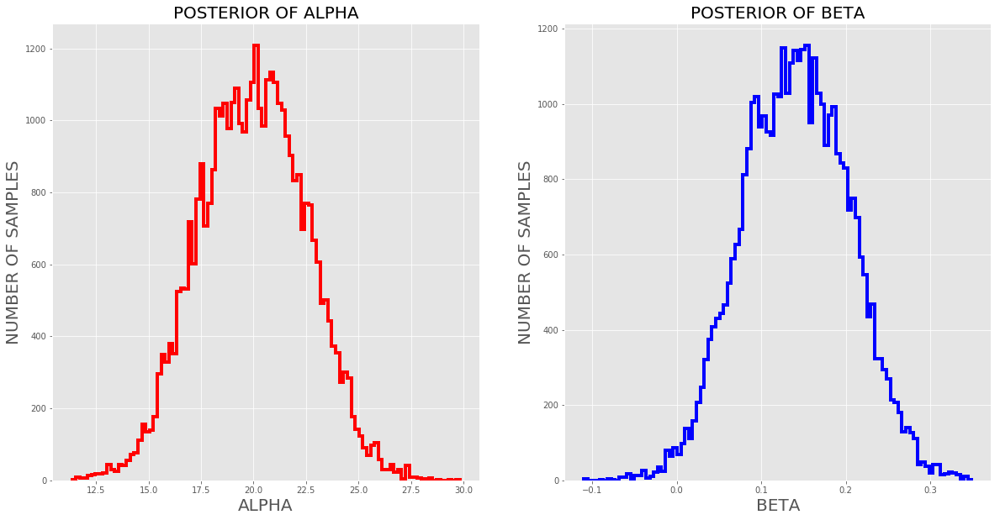

In [36]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.hist(trace['alpha'], histtype = 'step', lw = 4, bins=100, color = 'r')
plt.xlabel('ALPHA', fontsize = 20)
plt.ylabel('NUMBER OF SAMPLES', fontsize = 20)
plt.title('POSTERIOR OF ALPHA', fontsize = 20)

plt.subplot(122)
plt.hist(trace['beta'], histtype = 'step', lw = 4, bins=100, color = 'b')
plt.xlabel('BETA', fontsize = 20)
plt.ylabel('NUMBER OF SAMPLES', fontsize = 20)
plt.title('POSTERIOR OF BETA', fontsize = 20)

plt.show()

To check convergence of the MCMC we plot the autocorrelation function:

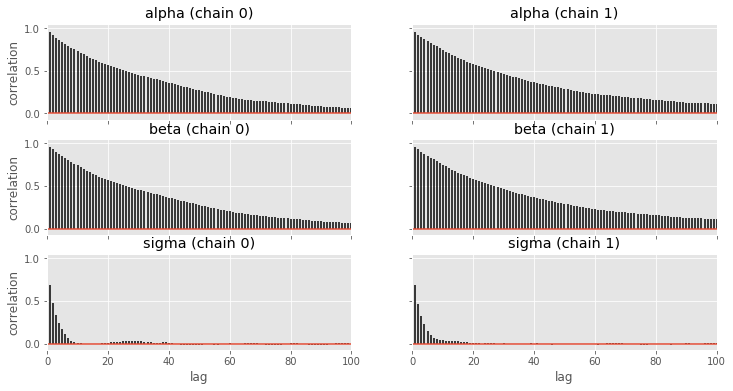

In [37]:
pm.autocorrplot(trace)
plt.show()

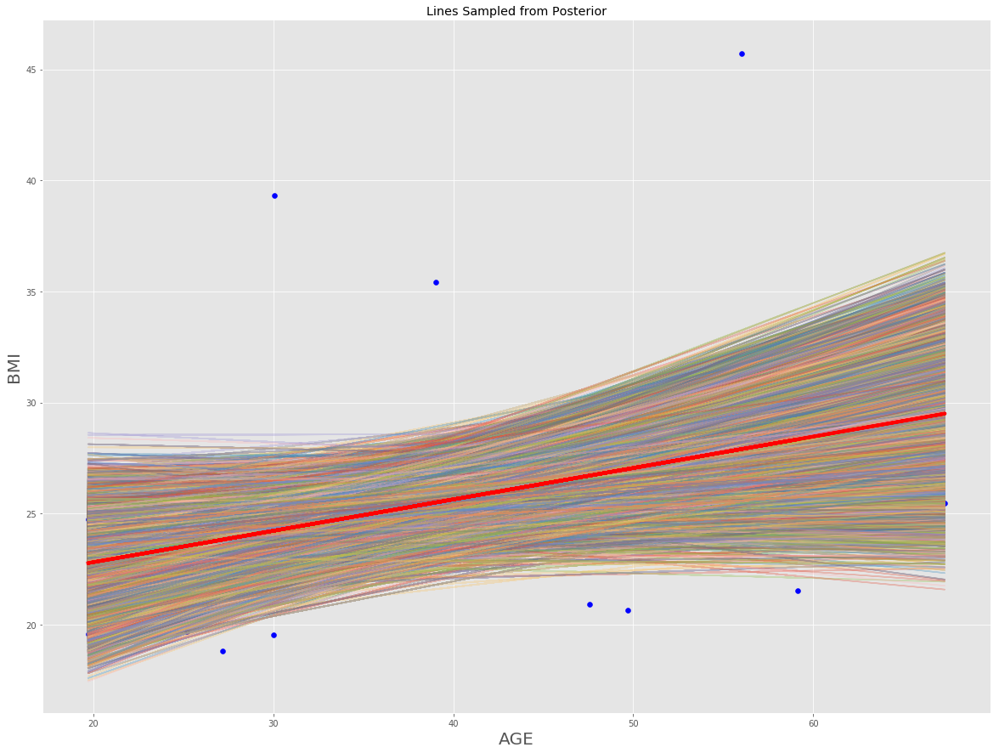

In [38]:
plt.figure(figsize=(20,15))

for alpha_posterior, beta_posterior in zip(trace['alpha'][:-1000],trace['beta'][:-1000]):
    plt.plot(phen['age_scr'], alpha_posterior + beta_posterior*phen['age_scr'],alpha=.3)
plt.xlabel('AGE',fontsize=20)
plt.ylabel('BMI',fontsize=20)
plt.title('Lines Sampled from Posterior')
plt.scatter(phen['age_scr'],phen['BMI'], color = 'b')
plt.plot(phen['age_scr'], alpha_b + beta_b*phen['age_scr'], color = 'r', lw = 4)

plt.show()

In [39]:
def bmi_at_age(age):
    trace_bmi = []
    for alpha_posterior, beta_posterior in zip(trace['alpha'][:-1000], trace['beta'][:-1000]):
        trace_bmi.append(alpha_posterior + beta_posterior*age)
    bmi_b_mean = np.mean(trace_bmi)
    bmi_b_std = np.std(trace_bmi)
    return bmi_b_mean, bmi_b_std
    
age = 37
print("BMI at Age = {} Years Old Should Be: {} +/- {}".format(age, bmi_at_age(age)[0], 2*bmi_at_age(age)[1]))

BMI at Age = 37 Years Old Should Be: 25.21362445174 +/- 1.8040066819853389
